# Spatio-temporal clustering

In [494]:
# le classique imports
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
import geopandas
import geoplot
from shapely.geometry import Polygon, Point
import numpy as np
from scipy import stats
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import geoplot.crs as gcrs
import matplotlib as mpl
import matplotlib.colors as colors
import random

pd.set_option('mode.chained_assignment', None)

# Definitions
## Paths and variables

In [495]:
path = 'C:/Users/Zaca/Documents/Datasets/nyc/'

## Plotting functions

In [613]:
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100, reverse=False):
   
    if reverse:
        new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(maxval, minval, n))) 
        
        arr = np.linspace(0, 50, 100).reshape((10, 10))
        fig, ax = plt.subplots(ncols=2)
        ax[0].imshow(arr, interpolation='nearest', cmap=cmap)
        ax[1].imshow(arr, interpolation='nearest', cmap=new_cmap)
        plt.show()
                
        return new_cmap
   
    else:
        new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
        
        arr = np.linspace(0, 50, 100).reshape((10, 10))
        fig, ax = plt.subplots(ncols=2)
        ax[0].imshow(arr, interpolation='nearest', cmap=cmap)
        ax[1].imshow(arr, interpolation='nearest', cmap=new_cmap)
        plt.show()
        
        return new_cmap
    
def default_plot(ax, spines): 
    
    ax = plt.gca()
    # Remove unnecessary axes and ticks (top and bottom)
    ax.spines["top"].set_visible(False)   
    ax.spines["right"].set_visible(False)
    ax.get_xaxis().tick_bottom()  
    ax.get_yaxis().tick_left()
    
    # Set the ticks facing OUTWARD
    ax.get_yaxis().set_tick_params(direction='out')
    ax.get_xaxis().set_tick_params(direction='out')
    
    # Remove grid
    #ax.grid('off')
    
    for loc, spine in ax.spines.items():
        if loc in spines:
            spine.set_position(('outward', 10))  # outward by 10 points

    # turn off ticks where there is no spine
    if 'left' in spines:
        ax.yaxis.set_ticks_position('left')
        
    if 'right' in spines:
        ax.yaxis.set_ticks_position('right')

    if 'bottom' in spines:
        ax.xaxis.set_ticks_position('bottom')

    return ax
    
def get_colors(cmap, n):
    cmap = mpl.cm.get_cmap(cmap)
    rgba = [cmap(x) for x in np.linspace(0.01, 0.99, n)]
    sns.palplot(sns.color_palette(rgba));    
    return rgba

def get_single_color(cmap, n):
    cmap = mpl.cm.get_cmap(cmap)
    rgba = cmap(n)
    return rgba

def precinct_selected(precinct, basemap):  
    basemap['selected'] = np.where(basemap.precinct == precinct, 1, 0)   
    ax = geoplot.choropleth(basemap, hue='selected', figsize=(8, 8), lw= 1, edgecolor='k', alpha=1, cmap=new_cmap, projection=gcrs.AlbersEqualArea())
    #geoplot.polyplot(basemap[basemap.precinct == precinct], lw=1, facecolor= get_single_color(new_cmap, .99), edgecolor='k', alpha=1)
    ax.set_title(str(precinct))
    
def view_clusters(basemap, labeled_data):
    ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)  
    for i in range(len(labeled_data.labels.unique())):
        ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color=cluster_colors[i], alpha=.75, s=100)
        
def temporal_distribution(labeled_data):   
    fig, ax = plt.subplots(figsize=(6,4))
    ax = default_plot(ax, ['left', 'bottom'])
    plt.xlabel('Time of Day')
    plt.ylabel('Density')
    plt.xlim(0, 24)
    
    min_time = []
    max_time = []
    
    for i in range(len(labeled_data.labels.unique())):
        sns.kdeplot(labeled_data[labeled_data.labels == i].time, bw=1.5, color=cluster_colors[i], label=str(i+1), lw=3)
        
        #min_calc = np.quantile(labeled_data[labeled_data.labels == i].time, .5) - 4
        #max_calc = np.quantile(labeled_data[labeled_data.labels == i].time, .5) + 4
        min_calc = max(set(list(labeled_data[labeled_data.labels == i].time)), key=list(labeled_data[labeled_data.labels == i].time).count) - 4
        max_calc = max(set(list(labeled_data[labeled_data.labels == i].time)), key=list(labeled_data[labeled_data.labels == i].time).count) + 4
        
        if min_calc < 0:
            min_calc = 24 + min_calc
        
        if max_calc > 24:
            max_calc = max_calc - 24
            
        min_time += [min_calc]
        max_time += [max_calc]
        
        print('Cluster ' + str(i) + ' schedule:', min_calc, max_calc)
    
    return list(zip(min_time, max_time))

## Algorithm functions

In [566]:
def random_points_within(poly, num_points):
  
    # get exterior limits of the polygon
    min_x, min_y, max_x, max_y = poly.bounds

    points = []
    
    # loop until n points is reached
    while len(points) < num_points:
        random_point = Point([random.uniform(min_x, max_x), random.uniform(min_y, max_y)])
        
        # if point inside polygon
        if (random_point.within(poly)):
            points.append(random_point)

    return points

def random_clusters(basemap, precinct, size):
    rps = random_points_within(basemap[basemap.precinct == precinct]['geometry'].unary_union, size)
    longs = [p.x for p in rps]
    lats = [p.y for p in rps]
    times = np.random.uniform(0, 24, size)
    training = pd.DataFrame({'latitude':lats, 'longitude':longs, 'time':times, 'precinct':[precinct]*size})
    return training

def make_contour(longitude, latitude, precinct_polygon, colors, levels):
    
    x = longitude
    y = latitude
    
    # check bounds
    xmin = precinct_polygon.bounds['minx'].values - 0.0025
    xmax = precinct_polygon.bounds['maxx'].values + 0.0025
    ymin = precinct_polygon.bounds['miny'].values - 0.0025
    ymax = precinct_polygon.bounds['maxy'].values + 0.0025
    
    # Create meshgrid
    xx, yy = np.mgrid[xmin:xmax:100j, ymin:ymax:100j]
    
    positions = np.vstack([xx.ravel(), yy.ravel()])
    values = np.vstack([x, y])
    kernel = stats.gaussian_kde(values)
    f = np.reshape(kernel(positions).T, xx.shape)
    cset = plt.contour(xx, yy, f, colors=colors, levels=levels, linewidths=1.5)
    
    return cset


def get_level(contour, n):
    
    # the n gives you the level
    # just remember that its backwards
    # the outermost level is 0
    
    x = []
    y = []
    for j in range(len(contour.allsegs)):
        for ii, seg in enumerate(contour.allsegs[j]):
            x += [seg[:,0]]
            y += [seg[:,1]]
    
    return list(zip(x[n], y[n]))  


def get_view_contours(basemap, labeled_data, precinct, levels):
    
    fig, ax = plt.subplots()
    plt.ylabel('Latitude')
    plt.xlabel('Longitude')
    contours = []
    for i in range(len(labeled_data.labels.unique())):
        ctr = make_contour(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], basemap[basemap.precinct == labeled_data.precinct.values[0]]['geometry'], colors=cluster_colors[i], levels=levels)
        contours += [ctr]

    levels = [get_level(x, 0) for x in contours]

    ax = geoplot.polyplot(basemap[basemap.precinct == labeled_data.precinct.values[0]], figsize=(8, 8), lw= 2, facecolor= 'None', edgecolor='k', alpha=1)
    for i in range(len(labeled_data.labels.unique())):
        ax.scatter(labeled_data[labeled_data.labels == i]['longitude'], labeled_data[labeled_data.labels == i]['latitude'], color=cluster_colors[i], alpha=.5, s=100)
        ax.plot([x[0] for x in levels[i]], [x[1] for x in levels[i]], color=cluster_colors[i], lw=3)
        
    return levels


def make_clusters(data, n):
    
    data = data[['latitude', 'longitude', 'time']]
    stdscaler = StandardScaler()
    features = stdscaler.fit_transform(data)
    cluster = KMeans(n)
    #cluster = AgglomerativeClustering(n)
    model = cluster.fit(features)
    
    # re-label so that cluster 0 is always the largest and so on.
    data['labels'] = model.labels_
    re_labeling = data.labels.value_counts().reset_index()['index']
    data['new_labels'] = data['labels'].replace(list(re_labeling.values), list(re_labeling.index))
    
    print('Cluster sizes:')
    print(data.new_labels.value_counts())
    
    return data.new_labels.values


def main(ds, training_period, precinct, n_clusters, testing_period, n_levels=3):
    
    subselection = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
    subselection['labels'] = make_clusters(subselection, n_clusters)
    precinct_selected(precinct, clean_map)
    view_clusters(clean_map, subselection)
    time_windows = temporal_distribution(subselection)
    contours = get_view_contours(clean_map, subselection, precinct=precinct, levels=n_levels)
    
    zones = [Polygon(x) for x in contours]
    start_time = [x[0] for x in time_windows]
    end_time = [x[1] for x in time_windows]
    
    test_selection = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
    test_points = [Point(x, y) for x, y in list(zip(test_selection.longitude, test_selection.latitude))]
    test_times = list(test_selection.time.values)
    
    landed = 0
    for c in range(n_clusters):
        for t in range(len(test_points)):
            if (test_points[t].within(zones[c])) and (start_time[c] <= test_times[t] <= end_time[c]):
                landed += 1
    
    print('Target crimes:', len(test_points))            
    if len(test_points) > 0:         
        score = landed/len(test_points)
        if score > 1:
            score = 1
    else:
        score = -1
    print('Precinct:', precinct)
    print('Events located:', score*100)
    
    return score*100


def random_main(ds, training_period, precinct, n_clusters, testing_period, n_levels=3):
    
    subselection = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
    simulated = random_clusters(clean_map, precinct, size=subselection.shape[0])
    simulated['labels'] = make_clusters(simulated, n_clusters)
    precinct_selected(precinct, clean_map)
    view_clusters(clean_map, simulated)
    time_windows = temporal_distribution(simulated)
    contours = get_view_contours(clean_map, simulated, precinct=precinct, levels=n_levels)
    
    zones = [Polygon(x) for x in contours]
    start_time = [x[0] for x in time_windows]
    end_time = [x[1] for x in time_windows]
    
    test_selection = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
    test_points = [Point(x, y) for x, y in list(zip(test_selection.longitude, test_selection.latitude))]
    test_times = list(test_selection.time.values)
    
    landed = 0
    for c in range(n_clusters):
        for t in range(len(test_points)):
            if (test_points[t].within(zones[c])) and (start_time[c] <= test_times[t] <= end_time[c]):
                landed += 1
    
    print('Target crimes:', len(test_points))            
    
    if len(test_points) > 0:         
        score = landed/len(test_points)
        
        if score > 1:
            score = 1
    else:
        score = -1
    
    print('Precinct:', precinct)
    print('Events located:', score*100)
    
    return score*100

# Choosing colors

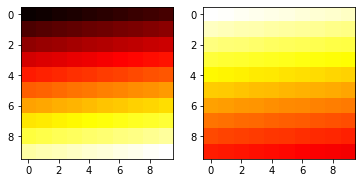

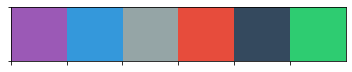

In [499]:
cmap = plt.get_cmap('hot')
new_cmap = truncate_colormap(cmap, 0.35, 1, reverse=True)

#cluster_colors = get_colors(cmap='cool_r', n=4)
#cluster_colors = ["#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
cluster_colors = ["#9b59b6", "#3498db", "#95a5a6", "#e74c3c", "#34495e", "#2ecc71"]
sns.palplot(sns.color_palette(cluster_colors));

# Preparing base maps

In [500]:
# open shapefile
pcints = geopandas.read_file(path + 'nypd_precincts.shp').to_crs(epsg=4326)

# clean a variable dtypes
pcints['pct'] = pcints['pct'].astype('int32')

# create a new, clean GeoDataFrame
clean_map = geopandas.GeoDataFrame()
clean_map['precinct'] = pcints['pct'].unique()
clean_map['geometry'] = [Polygon(max(pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union, key=lambda a: a.area).exterior) if pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union.geom_type == 'MultiPolygon' else Polygon(pcints.loc[pcints['pct'] == pct, 'geometry'].unary_union.exterior) for pct in clean_map.precinct]

# Read pre-processed data

In [501]:
# open data
crime = pd.read_csv(path + 'nypd_historic_07-18.csv', index_col=0)
# transform to datetime
crime['date'] = pd.to_datetime(crime['date'])

C:\Users\Zaca\Anaconda3\lib\site-packages\numpy\lib\arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


# Filter by crime

In [502]:
violent = ['FELONY ASSAULT', 'ROBBERY']
propert = ['BURGLARY', 'ARSON', 'GRAND LARCENY', 'GRAND LARCENY OF MOTOR VEHICLE']
popular_sites = ['RESID', 'STREET']
crime_filter = violent + propert
crime_subset = crime[crime.description.isin(crime_filter)]

In [503]:
#crime_subset[crime_subset.description == 'BURGLARY'].premises.value_counts()[:30]

# Select crime type

In [652]:
ds = crime_subset[(crime_subset.description == propert[0]) & (crime_subset.premises.str.contains(popular_sites[0]))]

# look at number of crime per precinct for exploration
highest_ = ds.groupby('precinct').agg(count=('date', 'count')).sort_values(by='count', ascending=False)

# Select algorithm parameters

In [656]:
precinct = 109
training_period = ['2015-01-01', '2017-01-01']
testing_period = ['2017-02-01', '2017-03-01']
n_clusters = 3
n_levels = 4 # how restrictive are the clusters

training = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
test = ds[(ds.date > testing_period[0]) & (ds.date < testing_period[1]) & (ds.precinct == precinct)][['latitude', 'longitude', 'time']].reset_index(drop=True)
test_points = [Point(x, y) for x, y in list(zip(test.longitude, test.latitude))]
test_times = list(test.time.values)

# Debugging section

Cluster sizes:
0    169
1    156
2    129
Name: new_labels, dtype: int64
Cluster 0 schedule: 14 22
Cluster 1 schedule: 5 13
Cluster 2 schedule: 8 16
Precinct: 109
# Target crimes: 8
Events located: 75.0


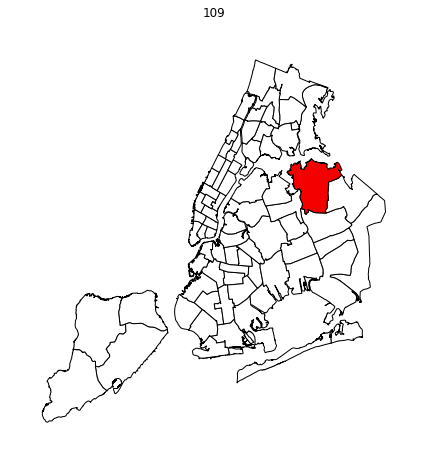

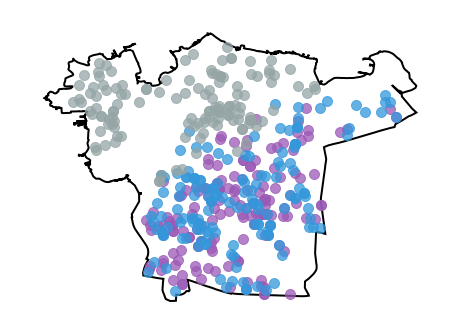

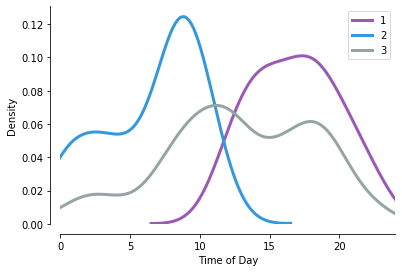

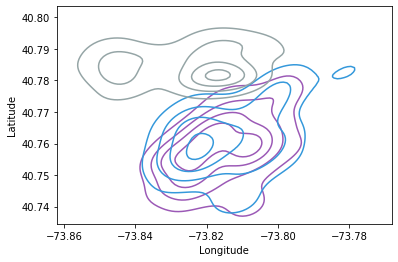

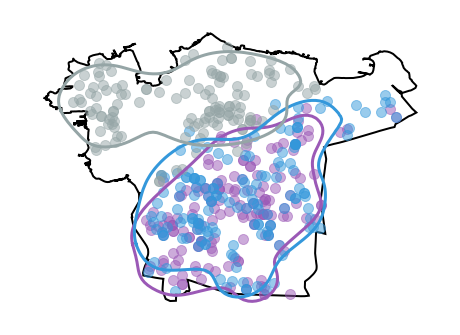

In [657]:
training = ds[(ds.date > training_period[0]) & (ds.date < training_period[1]) & (ds.precinct == precinct)]
# define and select clustering algorithm
training['labels'] = make_clusters(training, n_clusters)

# showing selected area
precinct_selected(precinct, clean_map)

# view clusters identified by training
view_clusters(clean_map, training)

# temporal distribution of clusters
time_windows = temporal_distribution(training)

# estimate kernel density and grab contours
contours = get_view_contours(clean_map, training, precinct, levels=n_levels)

# define clusters
zones = [Polygon(x) for x in contours]
start_time = [x[0] for x in time_windows]
end_time = [x[1] for x in time_windows]

landed = 0
for c in range(n_clusters):
    for t in range(len(test_points)):
        if (test_points[t].within(zones[c])) and (start_time[c] <= test_times[t] <= end_time[c]):
            landed += 1
                
if len(test_points) > 0:         
    score = landed/len(test_points)
    if score > 1:
        score = 1
else:
    score = -1

print('Precinct:', precinct)
print('# Target crimes:', len(test_points))
print('Events located:', score*100)

# For every precinct

In [658]:
# get list of precincts
precincts = list(highest_.index[:20])

In [659]:
precincts

[75,
 83,
 105,
 109,
 52,
 67,
 113,
 114,
 47,
 43,
 104,
 115,
 70,
 79,
 61,
 110,
 90,
 102,
 81,
 49]

Cluster sizes:
0    235
1    196
2    190
Name: new_labels, dtype: int64
Cluster 0 schedule: 4 12
Cluster 1 schedule: 14 22
Cluster 2 schedule: 8 16
Target crimes: 18
Precinct: 75
Events located: 50.0
Cluster sizes:
0    275
1    198
2    157
Name: new_labels, dtype: int64
Cluster 0 schedule: 5 13
Cluster 1 schedule: 13 21
Cluster 2 schedule: 10 18
Target crimes: 21
Precinct: 83
Events located: 85.71428571428571
Cluster sizes:
0    237
1    209
2    116
Name: new_labels, dtype: int64
Cluster 0 schedule: 3 11
Cluster 1 schedule: 12 20
Cluster 2 schedule: 8 16
Target crimes: 8
Precinct: 105
Events located: 62.5
Cluster sizes:
0    191
1    170
2     93
Name: new_labels, dtype: int64
Cluster 0 schedule: 14 22
Cluster 1 schedule: 5 13
Cluster 2 schedule: 8 16
Target crimes: 8
Precinct: 109
Events located: 62.5
Cluster sizes:
0    148
1    137
2    134
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 3 11
Cluster 1 schedule: 3 11
Cluster 2 schedule: 11 19


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 6
Precinct: 52
Events located: 66.66666666666666
Cluster sizes:
0    155
1    144
2    115
Name: new_labels, dtype: int64
Cluster 0 schedule: 7 15
Cluster 1 schedule: 10 18
Cluster 2 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 15
Precinct: 67
Events located: 60.0
Cluster sizes:
0    126
1    123
2    115
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 11 19
Cluster 2 schedule: 6 14


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 6
Precinct: 113
Events located: 100.0
Cluster sizes:
0    135
1    120
2    102
Name: new_labels, dtype: int64
Cluster 0 schedule:

C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


 4 12
Cluster 1 schedule: 14 22
Cluster 2 schedule: 5 13


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 6
Precinct: 114
Events located: 66.66666666666666
Cluster sizes:
0    187
1    156
2    132
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 11 19
Cluster 1 schedule: 3 11
Cluster 2 schedule: 13 21


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 24
Precinct: 47
Events located: 50.0
Cluster sizes:
0    173
1    160
2    132
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 4 12
Cluster 1 schedule: 10 18
Cluster 2 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 10
Precinct: 43
Events located: 20.0
Cluster sizes:
0    151
1    131
2    124
Name: new_labels, dtype: int64
Cluster 0 schedule: 5 13
Cluster 1 schedule: 7 15
Cluster 2 schedule: 10 18


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 26
Precinct: 104
Events located: 96.15384615384616
Cluster sizes:
0    153
1    102
2    101
Name: new_labels, dtype: int64
Cluster 0 schedule: 3 11
Cluster 1 schedule: 19 3


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 2 schedule: 7 15


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 18
Precinct: 115
Events located: 33.33333333333333
Cluster sizes:
0    119
1     99
2     98
Name: new_labels, dtype: int64
Cluster 0 schedule: 14 22
Cluster 1 schedule: 4 12
Cluster 2 schedule: 20 4


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 1
Precinct: 70
Events located: 0.0
Cluster sizes:
0    136
1    133
2    126
Name: new_labels, dtype: int64
Cluster 0 schedule: 5 13


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 1 schedule: 13 21
Cluster 2 schedule: 16 24


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 6
Precinct: 79
Events located: 50.0
Cluster sizes:
0    141
1    124
2    122
Name: new_labels, dtype: int64
Cluster 0 schedule: 3 11


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 1 schedule: 8 16
Cluster 2 schedule: 20 4


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 16
Precinct: 61
Events located: 25.0
Cluster sizes:
0    131
1    117
2     90
Name: new_labels, dtype: int64
Cluster 0 schedule: 5 13
Cluster 1 schedule: 8 16
Cluster 2 schedule: 14 22


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 24
Precinct: 110
Events located: 75.0
Cluster sizes:
0    126
1    120
2    112
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 12 20
Cluster 1 schedule: 5 13
Cluster 2 schedule: 10 18


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 7
Precinct: 90
Events located: 42.857142857142854
Cluster sizes:
0    93
1    92
2    87
Name: new_labels, dtype: int64
Cluster 0 schedule: 7 15
Cluster 1 schedule: 3 11
Cluster 2 schedule: 9 17


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 4
Precinct: 102
Events located: 50.0
Cluster sizes:
0    133
1    117
2    112
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 14 22
Cluster 1 schedule: 8 16
Cluster 2 schedule: 4 12


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much m

Target crimes: 9
Precinct: 81
Events located: 33.33333333333333
Cluster sizes:
0    98
1    95
2    56
Name: new_labels, dtype: int64
Cluster 0 schedule: 9 17
Cluster 1 schedule: 7 15
Cluster 2 schedule: 0 8


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 11
Precinct: 49
Events located: 18.181818181818183


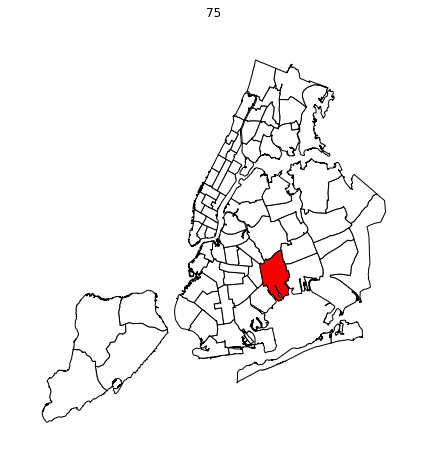

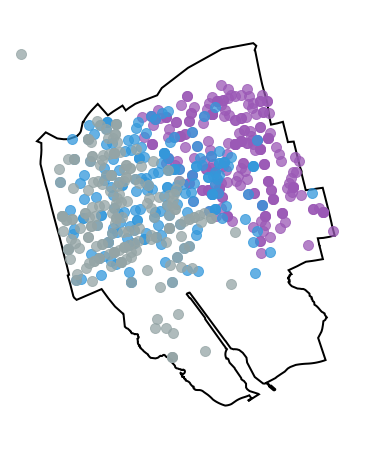

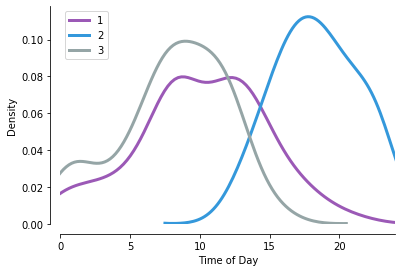

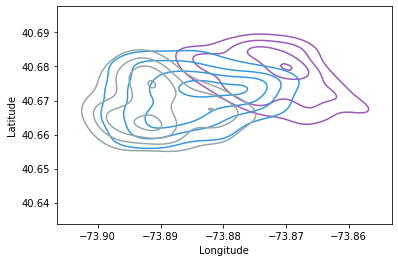

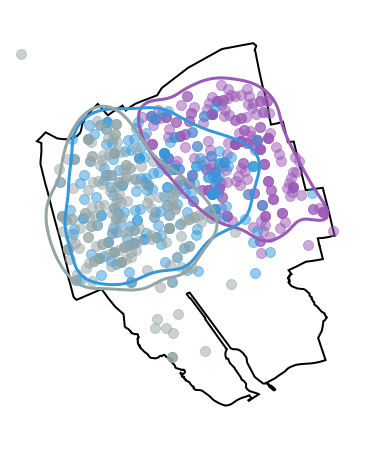

...

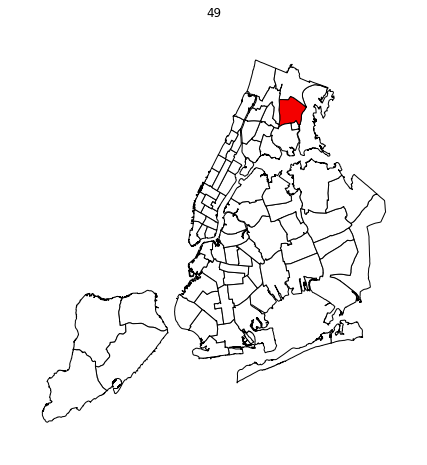

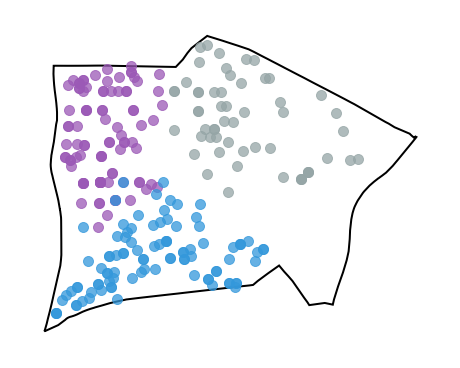

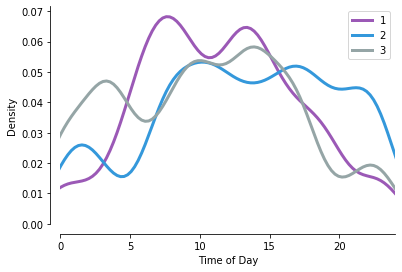

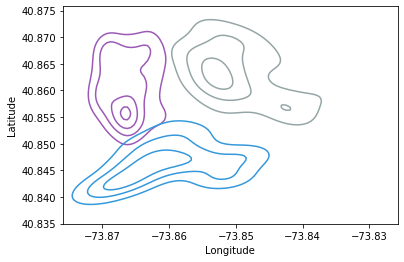

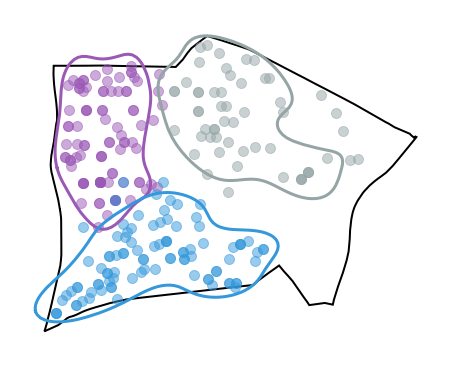

In [660]:
scores = []
for precinct in precincts:
    scores += [main(ds=ds, training_period=training_period, precinct=precinct, n_clusters=n_clusters, testing_period=testing_period, n_levels=n_levels)]

50.0


(0, 100)

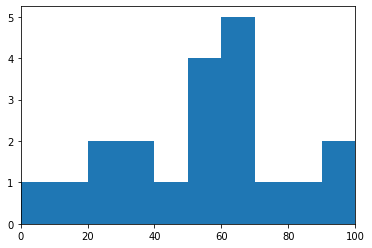

In [661]:
print(np.median(scores))
plt.hist(scores);
plt.xlim(0, 100)

Cluster sizes:
0    132
1    129
2    115
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.961489762955143 4.961489762955143
Cluster 1 schedule: 20.169476102779566 4.169476102779565
Cluster 2 schedule: 20.984025745899558 4.98402574589956
Target crimes: 30
Precinct: 75
Events located: 0.0
Cluster sizes:
0    119
1    106
2    105
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.077820479972765 4.077820479972766
Cluster 1 schedule: 20.128124654069346 4.128124654069346
Cluster 2 schedule: 7.827609493282251 15.827609493282251
Target crimes: 34
Precinct: 83
Events located: 55.88235294117647
Cluster sizes:
0    118
1    117
2    100
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.396016066160527 4.396016066160529
Cluster 1 schedule: 20.994226845647034 4.9942268456470345
Cluster 2 schedule: 2.816799450226137 10.816799450226137
Target crimes: 19
Precinct: 105
Events located: 15.789473684210526
Cluster sizes:
0    133
1    102
2     80
Name: new_labels, dtype: int64
Cluster 0 sc

C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 17
Precinct: 114
Events located: 41.17647058823529
Cluster sizes:
0    94
1    91
2    80
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

Cluster 0 schedule: 21.16288406633101 5.162884066331011
Cluster 1 schedule: 20.116098435803835 4.116098435803837
Cluster 2 schedule: 5.547892697069948 13.547892697069948
Target crimes: 17
Precinct: 67
Events located: 17.647058823529413
Cluster sizes:
0    111
1     81
2     78
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.111575270928878 4.111575270928877
Cluster 1 schedule: 20.000384274349695 4.000384274349695
Cluster 2 schedule: 20.025800842714204 4.025800842714206


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 12
Precinct: 52
Events located: 0.0
Cluster sizes:
0    125
1    106
2     96
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.905345017783304 4.905345017783306
Cluster 1 schedule: 20.491215962618416 4.491215962618416
Cluster 2 schedule: 8.694660603041882 16.694660603041882


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 21
Precinct: 47
Events located: 42.857142857142854
Cluster sizes:
0    106
1    101
2     93
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.658912730635812 4.658912730635812
Cluster 1 schedule: 20.805835587172798 4.8058355871727985
Cluster 2 schedule: 20.559869276620685 4.559869276620684


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 27
Precinct: 104
Events located: 0.0
Cluster sizes:
0    90
1    87
2    82
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 20.195890906507074 4.195890906507072
Cluster 1 schedule: 20.714207448928953 4.714207448928954
Cluster 2 schedule: 20.957036229298883 4.957036229298883


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 18
Precinct: 90
Events located: 0.0
Cluster sizes:
0    115
1    106
2    103
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 20.246170195570603 4.246170195570602
Cluster 1 schedule: 20.33928493037383 4.339284930373827
Cluster 2 schedule: 6.506971366860107 14.506971366860107


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 33
Precinct: 79
Events located: 21.21212121212121
Cluster sizes:
0    102
1     80
2     68
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 20.31588787147403 4.315887871474029
Cluster 1 schedule: 7.965086461958888 15.965086461958888
Cluster 2 schedule: 20.827396196026463 4.827396196026465


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 10
Precinct: 14
Events located: 40.0
Cluster sizes:
0    107
1    106
2    100
Name: new_labels, dtype: int64
Cluster 0 schedule: 8.915076430940578 16.91507643094058
Cluster 1 schedule: 20.04318412922206 4.043184129222058
Cluster 2 schedule:

C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


 20.283653886720984 4.283653886720985


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 19
Precinct: 43
Events located: 36.84210526315789
Cluster sizes:
0    70
2    63
1    63
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.922128997987777 4.922128997987777
Cluster 1 schedule: 21.18564359931213 5.185643599312131
Cluster 2 schedule:

C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


 20.968852392619446 4.968852392619448


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 9
Precinct: 113
Events located: 0.0
Cluster sizes:
0    71
1    63
2    45
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_wa

Cluster 0 schedule: 21.69010283999956 5.690102839999559
Cluster 1 schedule: 8.672358502759188 16.672358502759188
Cluster 2 schedule: 20.30739210291371 4.307392102913708
Target crimes: 14
Precinct: 70
Events located: 35.714285714285715
Cluster sizes:
0    90
1    83
2    72
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.717265680979782 4.717265680979781
Cluster 1 schedule: 

C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


20.582212357529503 4.582212357529502
Cluster 2 schedule: 20.9779372646486 4.9779372646486


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 25
Precinct: 115
Events located: 0.0
Cluster sizes:
0    68
1    60
2    56
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 20.162490622600423 4.162490622600425
Cluster 1 schedule: 7.254296379244273 15.254296379244273
Cluster 2 schedule: 20.543669492925876 4.5436694929258765


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, se

Target crimes: 18
Precinct: 61
Events located: 27.77777777777778
Cluster sizes:
0    58
1    56
2    53
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


Cluster 0 schedule: 20.97762851463287 4.97762851463287
Cluster 1 schedule: 20.979937373365168 4.979937373365169
Cluster 2 schedule: 8.746034208677269 16.74603420867727


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 17
Precinct: 66
Events located: 29.411764705882355
Cluster sizes:
0    65
1    57
2    55
Name: new_labels, dtype: int64


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Cluster 0 schedule: 20.536755834193446 4.536755834193446
Cluster 1 schedule: 20.081551894638288 4.081551894638289
Cluster 2 schedule: 23.33818990455636 7.338189904556358


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)


Target crimes: 19
Precinct: 49
Events located: 0.0
Cluster sizes:
0    98
1    72
2    57
Name: new_labels, dtype: int64
Cluster 0 schedule: 20.915718267595338 4.915718267595339
Cluster 1 schedule: 5.759738922466749 13.759738922466749
Cluster 2 schedule: 20.190000980030725 4.190000980030726


C:\Users\Zaca\Anaconda3\lib\site-packages\geoplot\geoplot.py:610: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=self.figsize)
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:84: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Zaca\Anaconda3\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, 

Target crimes: 16
Precinct: 110
Events located: 25.0


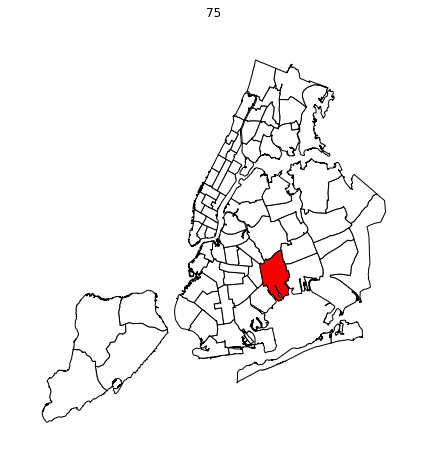

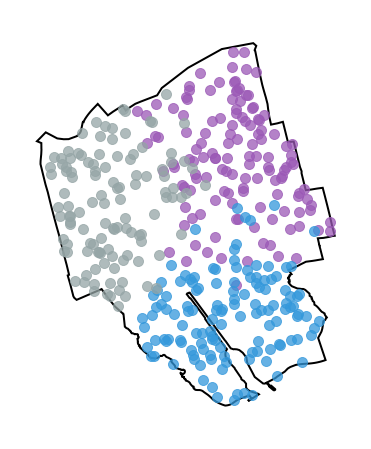

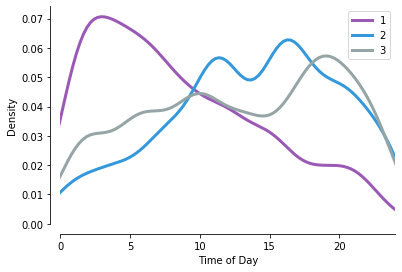

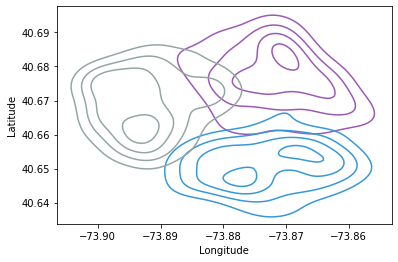

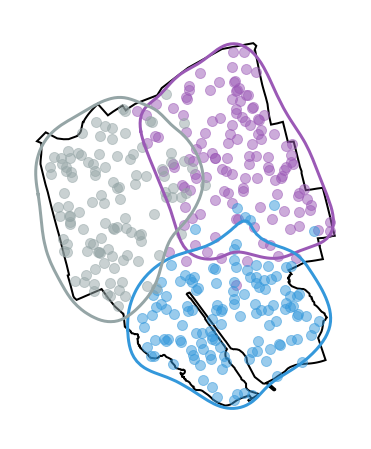

...

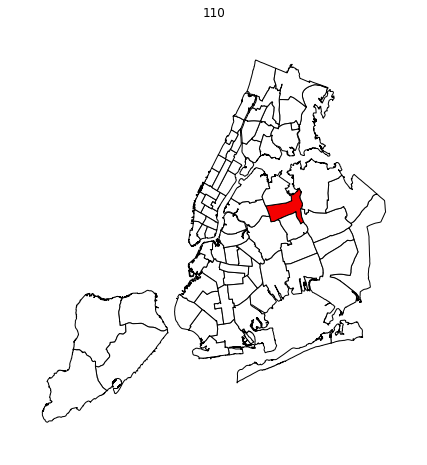

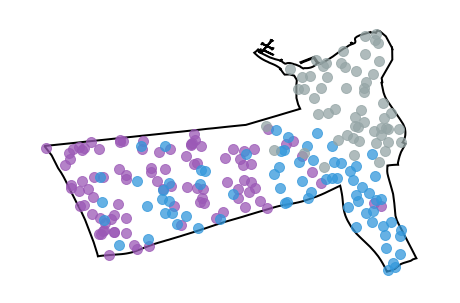

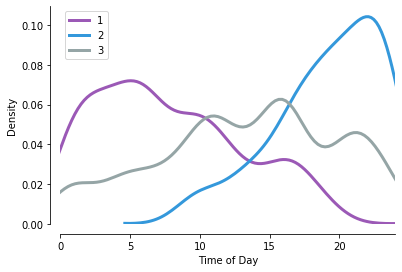

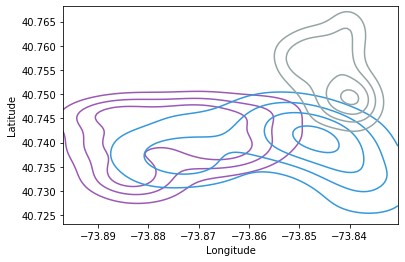

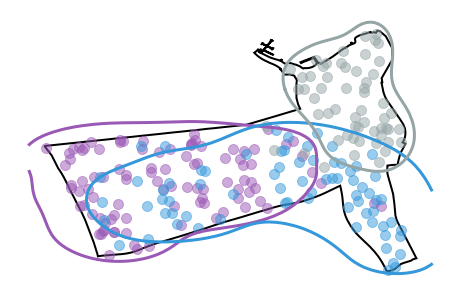

In [645]:
random_scores = []
for precinct in precincts:
    random_scores += [random_main(ds=ds, training_period=training_period, precinct=precinct, n_clusters=n_clusters, testing_period=testing_period, n_levels=n_levels)]

19.429590017825312


(0, 100)

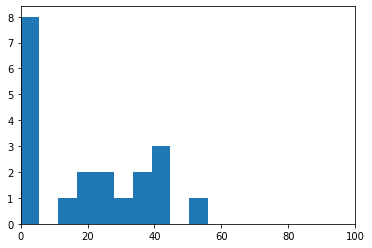

In [646]:
print(np.median(random_scores))
plt.hist(random_scores);
plt.xlim(0, 100)